# SSD_EFFICIENTDET_D1_640X640

In this google colab notebook, we make use of the SSD EFFICIENTDET D1 640X640 model to detect an object of interest (like glasses). 

The pre-tranied model will be imported from the Tensorflow Model Zoo. The TensorFlow Model Zoo is a collection of pre-trained models that are ready to be used with TensorFlow. The models can be used for prediction, feature extraction, and fine-tuning.

# STEP 1
INSTALL AND IMPORT THE REQUIRED LIBRARIES

In [1]:
!pip install --upgrade tensorflow keras numpy pandas sklearn pillow split-folders wget fast_ml tensorboard matplotlib seaborn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 511.7 MB 6.7 kB/s 
     |████████████████████████████████| 1.6 MB 51.4 MB/s 
     |████████████████████████████████| 3.1 MB 67.1 MB/s 
     |████████████████████████████████| 42 kB 1.1 MB/s 
     |████████████████████████████████| 5.8 MB 54.1 MB/s 
     |████████████████████████████████| 11.2 MB 50.5 MB/s 
     |████████████████████████████████| 438 kB 74.5 MB/s 
     |████████████████████████████████| 944 kB 61.6 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=c5c2256fdd318115dd16043f854748b36628b5d7109ea4bcf23a1485b7673d8c
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attemptin

In [1]:
from fast_ml.model_development import train_valid_test_split
from google.colab import drive
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import load_img, img_to_array


import cv2 as cv
import fnmatch
import glob
import numpy as np
import os
import pandas as pd
import re
import shutil
import splitfolders
import sys
import tensorflow as tf
import wget
import xml.etree.ElementTree as ET

from packaging import version

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
import tensorboard as tb

print(tf.__version__)

2.9.1


In [2]:
major_ver, minor_ver, _ = version.parse(tb.__version__).release
assert major_ver >= 2 and minor_ver >= 3, \
    "This notebook requires TensorBoard 2.3 or later."
print("TensorBoard version: ", tb.__version__)

TensorBoard version:  2.9.1


# STEP 2
MOUNT GOOGLE DRIVE AND CREATE PROJECT FOLDER

In [3]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
# Set your working directory to a folder in your Google Drive. This way, if your notebook times out,
# your files will be saved in your Google Drive!

# the base Google Drive directory
root_dir = "/content/drive/My Drive/"

# choose where you want your project files to be saved
project_folder = "customTF6"

def create_and_set_working_directory(project_folder):
  # check if your project folder exists. if not, it will be created.
  if os.path.isdir(root_dir + project_folder) == False:
    os.mkdir(root_dir + project_folder)
    print(root_dir + project_folder + ' did not exist but was created.')

  # change the OS to use your project folder as the working directory
  os.chdir(root_dir + project_folder)

  # create a test file to make sure it shows up in the right place
  #!touch 'new_file_in_working_directory.txt'
  print('\nYour working directory was changed to ' + root_dir + project_folder + \
        "\n\nYou can also run !pwd to confirm the current working directory." )

create_and_set_working_directory(project_folder)


Your working directory was changed to /content/drive/My Drive/customTF6

You can also run !pwd to confirm the current working directory.


In [ ]:
!pwd

/content/drive/My Drive/customTF6


In [5]:
# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/drive/My\ Drive/ /mydrive

In [ ]:
!ls /mydrive

 AI				     customTF5-Approach5
'Anannya & Parag'		     customTF6
'Asus Backup'			    'Dissertation Project'
'Birmingham Bihu 2022'		     Job_hunting
'Birmingham Bihu Videos'	    'My Drive'
'Bristol Pics'			     Official
 Colab				    'Shared Pics'
'Colab Notebooks'		     SsdMobNet320
'Colab Projects'		     SsdMobNet640
'Copy of SAFe POPM Activites.pptx'  'Test Images'
 customTF2			     TestModels
 customTF3			     UWE
 customTF4			     YoloV4Implementation


# ACQUIRE DATASET 

#Method 1a - Download the dataset from web URL

1. Downlaod
2. Preprocess
3. Save the data in Google Drive

In [ ]:
url  = 'https://arcraftimages.s3-accelerate.amazonaws.com/Datasets/Glasses/GlassesPascalVOC.zip?region=us-east-2'
filename = wget.download(url)

In [ ]:
!unzip '/content/drive/MyDrive/Project Directory/GlassesPascalVOC.zip' -d '/content/drive/MyDrive/Project Directory/GlassesDatasetJPEG'

Converting images to JPEG

In [ ]:
png_file_paths = glob.glob(r"/content/drive/MyDrive/Project Directory/GlassesDatasetJPEG/images/*.png")
for i, png_file_path in enumerate(png_file_paths):
    jpg_file_path = png_file_path[:-3] + "jpg";
   
    # Load .png image
    image = cv.imread(png_file_path)

    # Save .jpg image
    cv.imwrite(jpg_file_path, image, [int(cv.IMWRITE_JPEG_QUALITY), 100])

    pass

In [ ]:
# Remove the .PNG files from the images folder
mydir = '/content/drive/MyDrive/Dissertation Project/GlassesDatasetJPEG/images'
filelist = [ f for f in os.listdir(mydir) if f.endswith(".png") ]
for f in filelist:
    os.remove(os.path.join(mydir, f))

In [ ]:
shutil.rmtree('/content/drive/MyDrive/Dissertation Project/GlassesDatasetJPEG/__MACOSX')
shutil.rmtree('/content/drive/MyDrive/Dissertation Project/GlassesDatasetJPEG/annotations')
os.remove('/content/drive/MyDrive/Dissertation Project/GlassesDatasetJPEG/GlassesPascalVOC.zip')

In [ ]:
INPUT_IMAGE_FOLDER = '/content/drive/MyDrive/Dissertation Project/GlassesDatasetJPEG/'
OUTPUT_DATA_SPLIT_FOLDER = '/content/drive/MyDrive/Dissertation Project/GlassesDatasetJPEG/'
splitfolders.ratio(INPUT_IMAGE_FOLDER, output=OUTPUT_DATA_SPLIT_FOLDER, seed=1337, ratio=(.8, .1, .1), group_prefix=None, move=False)

# Method 1b - Building a dataset using webscraping

Link to the webScraping Colab notebook.

# Method 2 - Load images from cloud storage (Google Drive)

In [ ]:
# Define the source and destination path
from tqdm import tqdm

source = "/content/drive/MyDrive/Dissertation Project/Final Dataset/"
destination = "/content/drive/MyDrive/Dissertation Project/AllImages/"
  
# code to move the files from sub-folder to main folder.
dir_list = os.listdir(source)
print (len(dir_list))
print (dir_list)
for dirs in dir_list:
  full_dir = os.path.join(source + dirs)
  print (full_dir)
  files = os.listdir(full_dir)
  print("Number of files in ",dirs," are ",len(files))
  for fl in files:
    file_name = os.path.join(full_dir, fl)
    print(file_name)
    shutil.copy(file_name, destination)
print("Files Copied")

5
['Vision Lab Images', 'MakeML Glasses Dataset', 'Scraped Google Images Dataset', 'Camera Images', 'Fisheye Camera Sample Images']
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images
Number of files in  Vision Lab Images  are  253
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621130555930.jpg
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621131612861.jpg
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621130652673.jpg
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621131917120.jpg
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621131636930.jpg
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621130806095.jpg
/content/drive/MyDrive/Dissertation Project/Final Dataset/Vision Lab Images/Image_20220621131751046.jpg
/content/drive/M

In [ ]:
totalfiles = os.listdir(destination)
print ("Total Images- ", len(totalfiles))

Total Images-  929


In [ ]:
!pwd

/content/drive/MyDrive/customTF6


In [ ]:
shutil.rmtree("/content/drive/MyDrive/customTF6/all_images")

In [ ]:
source_dir = r"/content/drive/MyDrive/Dissertation Project/AllImages"
destination_dir = r"/content/drive/MyDrive/customTF6/all_images/EyeGlasses/"
shutil.copytree(source_dir, destination_dir)

'/content/drive/MyDrive/customTF6/all_images/EyeGlasses/'

Since there may be files of different formats, lets convert all the files into jpg format.

In [ ]:
os.chdir("/content/drive/MyDrive/customTF6/all_images/EyeGlasses/")

In [ ]:
!pwd

/content/drive/MyDrive/customTF6/all_images/EyeGlasses


In [ ]:
all_images_folder = glob.glob(r"/content/drive/MyDrive/customTF6/all_images/EyeGlasses/*")
for i, file_path in tqdm(enumerate(all_images_folder)):
    #jpg_file_path = all_images_folder[:-3] + "jpg";
    # Load image (which can be of any promat)
    image = cv.imread(file_path)

    # Save .jpg image
    cv.imwrite("EyeGlasses"+str(i)+".jpg", image, [int(cv.IMWRITE_JPEG_QUALITY), 100])

    pass

print("\n Processed "+str(i)+" of "+str(len(totalfiles))+" images")

929it [02:38,  5.87it/s]


 Processed 928 of 929 images


In [ ]:
for file in os.listdir(destination_dir):
    if not file.startswith("EyeGlasses"):
        os.remove(destination_dir+'/'+file)

# Split the images into TRAIN, TEST, and VALID split

In [ ]:
!pwd

/content/drive/MyDrive/customTF6/all_images/EyeGlasses


In [ ]:
os.chdir("/mydrive/customTF6")
!pwd

/content/drive/My Drive/customTF6


In [ ]:
INPUT_IMAGE_FOLDER = '/content/drive/MyDrive/customTF6/all_images/'
OUTPUT_DATA_SPLIT_FOLDER = '/content/drive/MyDrive/customTF6/all_images/'
splitfolders.ratio(INPUT_IMAGE_FOLDER, output=OUTPUT_DATA_SPLIT_FOLDER, seed=1337, ratio=(.8, .1, .1), group_prefix=None, move=False)

Copying files: 929 files [00:27, 34.00 files/s]


# Image Augmentation
Lets apply some image augmentation to the training dataset.

In [ ]:
# IMAGE AUGMENTATION FOR THE TRAIN IMAGES
datagen = ImageDataGenerator(
        rotation_range=45,
        rescale=1./255,
        horizontal_flip=True,
        vertical_flip=True)

# Enter Directory of where the images are saved
TRAIN_IMG_DIR = '/content/drive/MyDrive/customTF6/all_images/train/EyeGlasses/'
TRAIN_AUG_IMG_DIR = '/content/drive/MyDrive/customTF6/all_images/train/aug_EyeGlasses'

if not os.path.exists(TRAIN_AUG_IMG_DIR):
  os.makedirs(TRAIN_AUG_IMG_DIR)
    

# Enter list of all image names
img_list = os.listdir(TRAIN_IMG_DIR)

# Convert all images to numpy arrays
for img in img_list:
    img = load_img(TRAIN_IMG_DIR+img)  # PIL image
    x = img_to_array(img)  # Numpy array with shape (3, 150, 150)
    x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 3, 150, 150)
    
    # Generate batches of randomly transformed images
    # and save in specified directory
    i = 0
    for batch in datagen.flow(x, batch_size=1,
                          save_to_dir=TRAIN_AUG_IMG_DIR, save_prefix='TRAIN_AUG', save_format='jpeg'):
        i += 1
        if i > 4:
            # otherwise the generator would loop indefinitely
            break

In [ ]:
# Total files in the augmented folder
print ('Total Training Images before augmentation'+str(len(glob.glob(r"/content/drive/MyDrive/customTF6/all_images/train/EyeGlasses/*"))))
print ('Total Training Images after augmentation'+str(len(glob.glob(r"/content/drive/MyDrive/customTF6/all_images/aug_EyeGlasses/*"))))

# IMAGE LABELLING

Lets go ahead with the image labelling for both the test and train folders. 
Its difficult to get the images labelled from Google COLAB. Hence this activity needs to be done using the LabelImg utility. Canbe easily done in a laptop / desktop which has python installed.

# MODEL TRAINING PROCESS

With the images now labelled, now lets begin with the training process.

In [ ]:
os.chdir ("/content/drive/MyDrive/customTF6")

In [ ]:
!pwd

# Upload generate_tfrecord.py file to the customTF6 project folder
The generate_tfrecord.py script converts data from the PASCAL VOC dataset into a TFRecord file.

In [ ]:
!pwd

/content/drive/MyDrive/customTF6


In [ ]:
!git clone https://github.com/paragsharma1/ObjectDetectionUtilityFilesTF2.x.git

Cloning into 'ObjectDetectionUtilityFilesTF2.x'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 4 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (4/4), done.


In [ ]:
shutil.move("/content/drive/MyDrive/customTF6/ObjectDetectionUtilityFilesTF2.x/generate_tfrecord.py", "/content/drive/MyDrive/customTF6") 

'/content/drive/MyDrive/customTF6/generate_tfrecord.py'

# Clone the tensorflow models git repository & Install TensorFlow Object Detection API

In [6]:
!pwd

/content/drive/MyDrive/customTF6


In [ ]:
# clone the tensorflow models on the colab cloud vm
!git clone --q https://github.com/tensorflow/models.git

#navigate to /models/research folder to compile protos
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

fatal: destination path 'models' already exists and is not an empty directory.
/content/drive/MyDrive/customTF6/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/drive/MyDrive/customTF6/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


# Test model builder

In [ ]:
!pwd

/content/drive/MyDrive/customTF6/models/research


In [ ]:
# testing the model builder
!python object_detection/builders/model_builder_tf2_test.py

2022-07-28 16:27:07.377567: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
W0728 16:27:07.840048 139824449877888 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.8s
I0728 16:27:08.180555 139824449877888 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.8s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.66s
I0728 16:27:08.842896 139824449877888 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_crea

# Create the CSV files and the "label_map.pbtxt" file
Current working directory - /mydrive/customTF6/data/

The xml_to_csv script needs to be run to create test_labels.csv and train_labels.csv files. This also creates the label_map.pbtxt file using the classes mentioned in the xml files.

In [ ]:
!pwd

/content/drive/MyDrive/customTF6/models/research


In [ ]:
os.chdir('/mydrive/customTF6/')

In [ ]:
from pathlib import Path
Path("/mydrive/customTF6/data/").mkdir(parents=True, exist_ok=True)

In [ ]:
os.chdir('/mydrive/customTF6/data/')
!pwd

/content/drive/My Drive/customTF6/data


In [ ]:
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text,   
               int(root.find('size/width').text),
               int(root.find('size/height').text),
               root.find('object/name').text,
               int(root.find('object/bndbox/xmin').text),
               int(root.find('object/bndbox/ymin').text),
               int(root.find('object/bndbox/xmax').text),
               int(root.find('object/bndbox/ymax').text))
      xml_list.append(value)
      print(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

In [ ]:
for label_path in ['/content/drive/MyDrive/customTF6/all_images/train/aug_EyeGlasses_Annotations', '/content/drive/MyDrive/customTF6/all_images/test/aug_EyeGlasses_Test_Annotations']:
  #image_path = os.path.join(os.getcwd(), label_path)
  #print(image_path)
  print(label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')   

/content/drive/MyDrive/customTF6/all_images/train/aug_EyeGlasses_Annotations
('TRAIN_AUG_0_6780.jpeg', 3072, 2048, 'Glasses', 599, 1, 1879, 1850)
('TRAIN_AUG_0_6782.jpeg', 500, 500, 'Glasses', 15, 118, 487, 381)
('TRAIN_AUG_0_6786.jpeg', 389, 219, 'Glasses', 88, 43, 353, 219)
('TRAIN_AUG_0_6788.jpeg', 267, 400, 'Glasses', 122, 292, 150, 321)
('TRAIN_AUG_0_6789.jpeg', 400, 267, 'Glasses', 52, 115, 300, 193)
('TRAIN_AUG_0_6790.jpeg', 400, 247, 'Glasses', 46, 47, 363, 192)
('TRAIN_AUG_0_6792.jpeg', 400, 400, 'Glasses', 110, 189, 243, 343)
('TRAIN_AUG_0_6795.jpeg', 1920, 1200, 'Glasses', 933, 109, 1704, 820)
('TRAIN_AUG_0_6802.jpeg', 500, 500, 'Glasses', 54, 158, 460, 424)
('TRAIN_AUG_0_6806.jpeg', 4244, 2504, 'Glasses', 830, 1, 4244, 2504)
('TRAIN_AUG_0_6807.jpeg', 500, 500, 'Glasses', 21, 109, 487, 386)
('TRAIN_AUG_0_6808.jpeg', 568, 326, 'Glasses', 33, 50, 561, 293)
('TRAIN_AUG_0_6813.jpeg', 5184, 3456, 'Glasses', 975, 591, 2792, 2903)
('TRAIN_AUG_0_6814.jpeg', 300, 400, 'Glasses', 149,

# Create train.record & test.record files
Current working directory is /mydrive/customTF6/data/ Finally, lets run the generate_tfrecord.py script to create train.record and test.record files.

In [ ]:
!pwd

/content/drive/MyDrive/customTF6/data


In [ ]:
os.chdir('/content/drive/MyDrive/customTF6/data')
!pwd

/content/drive/MyDrive/customTF6/data


In [ ]:
shutil.move('/mydrive/customTF6/label_map.pbtxt', '/mydrive/customTF6/data/')

'/mydrive/customTF6/data/label_map.pbtxt'

In [ ]:
#Usage:  
#!python generate_tfrecord.py output.csv output_pb.txt /path/to/images output.tfrecords

#For train.record
!python /mydrive/customTF6/generate_tfrecord.py /mydrive/customTF6/all_images/train/aug_EyeGlasses_Annotations.csv  label_map.pbtxt /mydrive/customTF6/all_images/train/aug_EyeGlasses/ train.record

#For test.record
!python /mydrive/customTF6/generate_tfrecord.py /mydrive/customTF6/all_images/test/aug_EyeGlasses_Test_Annotations.csv  label_map.pbtxt /mydrive/customTF6/all_images/test/EyeGlasses/ test.record

groups: 100% 3110/3110 [23:36<00:00,  2.20it/s]
Successfully created the TFRecords: /content/drive/My Drive/customTF6/data/train.record
groups: 100% 94/94 [00:45<00:00,  2.06it/s]
Successfully created the TFRecords: /content/drive/My Drive/customTF6/data/test.record


#Download pre-trained model checkpoint - EfficieintDet 640x640 
Set the current working directory is /mydrive/customTF6/data/

EfficientDet D1 640x640

Now, we need to download the efficientdet_d1_coco17_tpu-32.tar.gz.gz into the data folder & unzip it. A list of detection checkpoints for tensorflow 2.x can be found here.

In [ ]:
os.chdir('/mydrive/customTF6/data/')
!pwd

/content/drive/My Drive/customTF6/data


In [ ]:
#Download the pre-trained model EfficientDet D7 1536x1536

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz


--2022-07-17 22:44:54--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.119.128, 2a00:1450:4013:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.119.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 51839363 (49M) [application/x-tar]
Saving to: ‘efficientdet_d1_coco17_tpu-32.tar.gz’

efficientdet_d1_coc 100%[===================>]  49.44M  38.5MB/s    in 1.3s    

2022-07-17 22:44:56 (38.5 MB/s) - ‘efficientdet_d1_coco17_tpu-32.tar.gz’ saved [51839363/51839363]



In [ ]:
!tar -xzvf efficientdet_d1_coco17_tpu-32.tar.gz

efficientdet_d1_coco17_tpu-32/
efficientdet_d1_coco17_tpu-32/checkpoint/
efficientdet_d1_coco17_tpu-32/checkpoint/ckpt-0.data-00000-of-00001
efficientdet_d1_coco17_tpu-32/checkpoint/checkpoint
efficientdet_d1_coco17_tpu-32/checkpoint/ckpt-0.index
efficientdet_d1_coco17_tpu-32/pipeline.config
efficientdet_d1_coco17_tpu-32/saved_model/
efficientdet_d1_coco17_tpu-32/saved_model/saved_model.pb
efficientdet_d1_coco17_tpu-32/saved_model/assets/
efficientdet_d1_coco17_tpu-32/saved_model/variables/
efficientdet_d1_coco17_tpu-32/saved_model/variables/variables.data-00000-of-00001
efficientdet_d1_coco17_tpu-32/saved_model/variables/variables.index


# Make relevant changes in the model pipeline config file
Set the current working directory is /mydrive/customTF6/data/

We need to copy the config file from /content/models/research/object_detection/configs/tf2 to the /mydrive/customTF6/data folder and then edit the same.


In [ ]:
os.chdir('/mydrive/customTF6/data')
!pwd

/content/drive/My Drive/customTF6/data


Edit the config file relevant to thedownloaded model. In our case, we will have to edit the following file- 
'ssd_efficientdet_d1_640x640_coco17_tpu-8.config'

We need to make the following changes:

* num_classes to the number of classes we are detecting.In our case its 1.
* test.record path, train.record path & labelmap paths to match our files.
* fine_tune_checkpoint to the path of the directory where the downloaded checkpoint is.
* fine_tune_checkpoint_type to detection
* batch_size to 64 (reduce if the notebook  crashes)
* change num_steps 50000


Save the file.

CAREFUL- RUN THIS ONLY FOR EFFICIENTDET D1 640x640

In [ ]:
SOURCE_CONFIG_FILE_PATH = '/mydrive/customTF6/models/research/object_detection/configs/tf2/ssd_efficientdet_d1_640x640_coco17_tpu-8.config'
DEST_CONFIG_FILE_PATH = '/mydrive/customTF6/data'
shutil.copy(SOURCE_CONFIG_FILE_PATH, DEST_CONFIG_FILE_PATH)

'/mydrive/customTF6/data/ssd_efficientdet_d1_640x640_coco17_tpu-8.config'

# Load Tensorboard
Tensorboard is a visualization tool for TensorFlow. It is used to visualize the data flow graphs and track the training progress.

In [ ]:
#load tensorboard

%load_ext tensorboard         
%tensorboard --logdir '/mydrive/customTF6/model_training_EffDet640'

# Uncomment the below line to check the data for MobileNet640 
#%tensorboard --logdir '/mydrive/customTF6/model_training_FPN_MNet640'
#%tensorboard --logdir '/mydrive/customTF6/model_training_FPN_MNet640/eval'

# Uncomment the below line to check the data for MobileNet320
#%tensorboard --logdir '/mydrive/customTF6/model_training/train'
#%tensorboard --logdir '/mydrive/customTF6/model_training/eval'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Model Trainig with our dataset

In [ ]:
%cd /mydrive/customTF6/models/research/object_detection

/content/drive/My Drive/customTF6/models/research/object_detection


In [ ]:
!pip list|grep opencv

opencv-contrib-python         4.6.0.66
opencv-python                 4.6.0.66
opencv-python-headless        4.6.0.66


In [ ]:
!pip uninstall opencv-python-headless --y

Found existing installation: opencv-python-headless 4.6.0.66
Uninstalling opencv-python-headless-4.6.0.66:
  Successfully uninstalled opencv-python-headless-4.6.0.66


In [ ]:
!pip install opencv-python-headless==4.1.2.30

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.8 MB 207 kB/s 


In [ ]:
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  libcudnn8-dev
The following held packages will be changed:
  libcudnn8
The following packages will be upgraded:
  libcudnn8
1 upgraded, 0 newly installed, 1 to remove and 47 not upgraded.
Need to get 430 MB of archives.
After this operation, 3,139 MB disk space will be freed.
Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  libcudnn8 8.1.0.77-1+cuda11.2 [430 MB]
Fetched 430 MB in 14s (31.2 MB/s)
(Reading database ... 155653 files and directories currently installed.)
Removing libcudnn8-dev (8.0.5.39-1+cuda11.1) ...
(Reading database ... 155631 files and directories currently installed.)
Preparing to unpack .../libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+

RUN THIS COMMAND TO TRAIN EFFCIENTDET D1 MODEL

In [ ]:
!python model_main_tf2.py --pipeline_config_path=/mydrive/customTF6/data/ssd_efficientdet_d1_640x640_coco17_tpu-8.config --model_dir=/mydrive/customTF6/model_training_EffDet640 --alsologtostderr

Streaming output truncated to the last 5000 lines.
 'Loss/regularization_loss': 0.05591987,
 'Loss/total_loss': 0.28146136,
 'learning_rate': 0.07998374}
I0718 00:37:11.520317 139784977721216 model_lib_v2.py:708] {'Loss/classification_loss': 0.1658224,
 'Loss/localization_loss': 0.059719067,
 'Loss/regularization_loss': 0.05591987,
 'Loss/total_loss': 0.28146136,
 'learning_rate': 0.07998374}
INFO:tensorflow:Step 5300 per-step time 0.945s
I0718 00:38:46.025207 139784977721216 model_lib_v2.py:707] Step 5300 per-step time 0.945s
INFO:tensorflow:{'Loss/classification_loss': 0.15535876,
 'Loss/localization_loss': 0.04356211,
 'Loss/regularization_loss': 0.056204267,
 'Loss/total_loss': 0.25512514,
 'learning_rate': 0.07998252}
I0718 00:38:46.025484 139784977721216 model_lib_v2.py:708] {'Loss/classification_loss': 0.15535876,
 'Loss/localization_loss': 0.04356211,
 'Loss/regularization_loss': 0.056204267,
 'Loss/total_loss': 0.25512514,
 'learning_rate': 0.07998252}
INFO:tensorflow:Step 540

# Run evaluation metrics

In [ ]:
# Evaluation metrics for SSD EFFICIENTDET D1 640x640
!python model_main_tf2.py --pipeline_config_path=/mydrive/customTF6/data/ssd_efficientdet_d1_640x640_coco17_tpu-8.config --model_dir=/mydrive/customTF6/model_training_EffDet640 --checkpoint_dir=/mydrive/customTF6/model_training_EffDet640

W0718 20:22:20.393197 139803022641024 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0718 20:22:20.393436 139803022641024 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0718 20:22:20.393500 139803022641024 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0718 20:22:20.393563 139803022641024 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0718 20:22:20.393646 139803022641024 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-07-18 20:22:21.143852: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config 

UPLOAD THE LOG FILE TO THE TENSORBOARD.DEV FOR CUSTOM PLOT TO GENERATE AN EXPERIMENT ID WHICH CAN THEN BE USED FOR CUSTOM PLOTTING (REF - https://www.tensorflow.org/tensorboard/dataframe_api)
**Experiment ID for Loss Metrics**

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/customTF6/model_training_EffDet640/train \
  --name "EfficientDetD1 Glasses Dataset Training " \
  --description "EfficientDetD1 Glasses Dataset Training" \
  --one_shot

2022-07-28 16:51:10.573622: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

/content/drive/MyDrive/customTF6/model_training_EffDet640/train

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.

In [ ]:
experiment_id = "FK3N14fRSoaBPoLwqzVIJQ"
experiment = tb.data.experimental.ExperimentFromDev(experiment_id)
df = experiment.get_scalars()
df

,run,tag,step,value
0,.,Loss/classification_loss,100,0.530192
1,.,Loss/classification_loss,200,0.356233
2,.,Loss/classification_loss,300,0.424954
3,.,Loss/classification_loss,400,0.446051
4,.,Loss/classification_loss,500,0.285770
...,...,...,...,...
2995,.,steps_per_sec,49600,1.055053
2996,.,steps_per_sec,49700,1.056244
2997,.,steps_per_sec,49800,1.052766
2998,.,steps_per_sec,49900,1.048548


In [ ]:
print(df["run"].unique())
print(df["tag"].unique())

['.']
['Loss/classification_loss' 'Loss/localization_loss'
 'Loss/regularization_loss' 'Loss/total_loss' 'learning_rate'
 'steps_per_sec']


In [ ]:
dfw = experiment.get_scalars(pivot=True) 
dfw

,run,step,Loss/classification_loss,Loss/localization_loss,Loss/regularization_loss,Loss/total_loss,learning_rate,steps_per_sec
0,.,100,0.530192,0.585782,0.029550,1.145523,0.004160,0.555190
1,.,200,0.356233,0.267999,0.029624,0.653856,0.007320,1.062270
2,.,300,0.424954,0.329631,0.029763,0.784348,0.010480,1.061139
3,.,400,0.446051,0.306763,0.029973,0.782787,0.013640,1.062856
4,.,500,0.285770,0.231399,0.030194,0.547364,0.016800,1.067558
...,...,...,...,...,...,...,...,...
495,.,49600,0.083155,0.008393,0.080060,0.171609,0.075154,1.055053
496,.,49700,0.132920,0.047641,0.080053,0.260614,0.075133,1.056244
497,.,49800,0.162028,0.088003,0.080074,0.330105,0.075113,1.052766
498,.,49900,0.122762,0.048163,0.080045,0.250970,0.075093,1.048548


In [ ]:
csv_path = '/content/drive/MyDrive/customTF6/model_training_EffDet640/train/EfficientDetD1_tb_experiment_1.csv'
dfw.to_csv(csv_path, index=False)
dfw_roundtrip = pd.read_csv(csv_path)
pd.testing.assert_frame_equal(dfw_roundtrip, dfw)

Text(0.5, 1.0, 'learning rate')

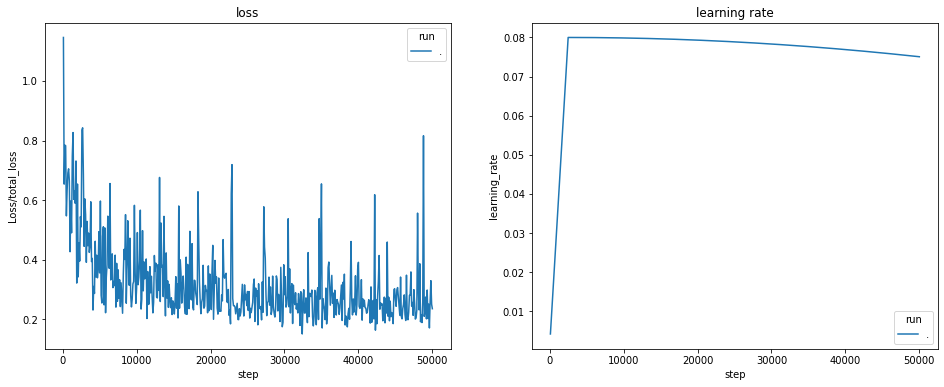

In [ ]:
# Filter the DataFrame to only validation data, which is what the subsequent
# analyses and visualization will be focused on.
dfw_validation = dfw
# Get the optimizer value for each row of the validation DataFrame.
optimizer_validation = dfw_validation.run.apply(lambda run: run.split(",")[0])

plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.lineplot(data=dfw_validation, x="step", y="Loss/total_loss",
             hue=optimizer_validation).set_title("loss")
plt.subplot(1, 2, 2)
sns.lineplot(data=dfw_validation, x="step", y="learning_rate",
             hue=optimizer_validation).set_title("learning rate")

**UPLOAD THE EVALUATION LOG FILE TO TENSORFLOW.DEV FROM THE EVALUATION FOLDER**

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/customTF6/model_training_EffDet640/eval \
  --name "EfficientDetD1 Glasses Dataset  - evaluation log file  " \
  --description "EfficientDetD1 Glasses Dataset  - evaluation log file" \
  --one_shot

2022-07-28 16:57:41.654949: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/F93FA5W4TPOdACl2jpL3Fw/

[2022-07-28T16:57:42] Started scanning logdir.
[2022-07-28T16:57:42] Total uploaded: 16 scalars, 0 tensors, 0 binary objects
[2022-07-28T16:57:42] Done scanning logdir.


Done. View your TensorBoard at https://tensorboard.dev/experiment/F93FA5W4TPOdACl2jpL3Fw/


In [ ]:
experiment_id_acc = "F93FA5W4TPOdACl2jpL3Fw"
experiment_acc = tb.data.experimental.ExperimentFromDev(experiment_id_acc)
df_acc = experiment.get_scalars()
df_acc

,run,tag,step,value
0,.,Loss/classification_loss,100,0.530192
1,.,Loss/classification_loss,200,0.356233
2,.,Loss/classification_loss,300,0.424954
3,.,Loss/classification_loss,400,0.446051
4,.,Loss/classification_loss,500,0.285770
...,...,...,...,...
2995,.,steps_per_sec,49600,1.055053
2996,.,steps_per_sec,49700,1.056244
2997,.,steps_per_sec,49800,1.052766
2998,.,steps_per_sec,49900,1.048548


In [ ]:
print(df_acc["run"].unique())
print(df_acc["tag"].unique())

['.']
['Loss/classification_loss' 'Loss/localization_loss'
 'Loss/regularization_loss' 'Loss/total_loss' 'learning_rate'
 'steps_per_sec']


In [ ]:
dfw_acc = experiment_acc.get_scalars(pivot=True) 
dfw_acc

,run,step,DetectionBoxes_Precision/mAP,DetectionBoxes_Precision/mAP (large),DetectionBoxes_Precision/mAP (medium),DetectionBoxes_Precision/mAP (small),DetectionBoxes_Precision/mAP@.50IOU,DetectionBoxes_Precision/mAP@.75IOU,DetectionBoxes_Recall/AR@1,DetectionBoxes_Recall/AR@10,DetectionBoxes_Recall/AR@100,DetectionBoxes_Recall/AR@100 (large),DetectionBoxes_Recall/AR@100 (medium),DetectionBoxes_Recall/AR@100 (small),Loss/classification_loss,Loss/localization_loss,Loss/regularization_loss,Loss/total_loss
0,.,50000,0.505114,0.602906,0.295898,0.5,0.666922,0.59653,0.513636,0.547727,0.571212,0.668889,0.358537,0.5,0.242177,0.100163,0.08002,0.42236


In [ ]:
csv_path_acc = '/content/drive/MyDrive/customTF6/model_training_EffDet640/eval/EfficientDetD1_tb_experiment_1.csv'
dfw_acc.to_csv(csv_path_acc, index=False)
dfw_acc_roundtrip = pd.read_csv(csv_path_acc)
pd.testing.assert_frame_equal(dfw_acc_roundtrip, dfw_acc)

0    .
Name: run, dtype: object


Text(0.5, 1.0, 'Recall')

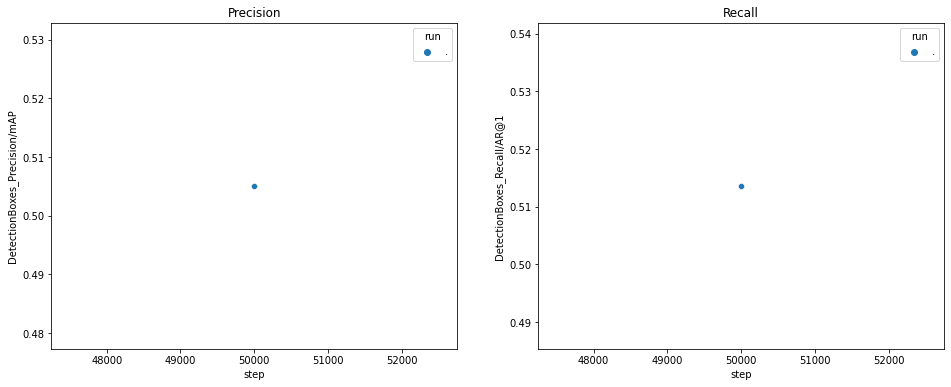

In [ ]:
# Filter the DataFrame to only validation data, which is what the subsequent
# analyses and visualization will be focused on.
dfw_eval = dfw_acc
# Get the optimizer value for each row of the validation DataFrame.
optimizer_validation = dfw_eval.run.apply(lambda run: run.split(",")[0])
print(optimizer_validation)
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(data=dfw_eval, x="step", y="DetectionBoxes_Precision/mAP", hue=optimizer_validation).set_title("Precision")
#sns.lineplot(data=dfw_eval, x="step", y="DetectionBoxes_Precision/mAP	", hue=optimizer_validation).set_title("loss")
plt.subplot(1, 2, 2)
sns.scatterplot(data=dfw_eval, x="step", y="DetectionBoxes_Recall/AR@1", hue=optimizer_validation).set_title("Recall")

# Testing the trained model

In [ ]:
!pwd

/content/drive/My Drive/customTF6/models/research/object_detection


In [ ]:
# Export inference graph 
# Current working directory is /content/models/research/object_detection
#SSD MOBILENET v2 FPNLITE 640x640 
!python exporter_main_v2.py --trained_checkpoint_dir=/mydrive/customTF6/model_training --pipeline_config_path=/mydrive/customTF6/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config --output_directory /content/drive/MyDrive/customTF6/data/inference_graph

2022-07-15 15:53:12.144218: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0715 15:53:13.557355 140515951986560 deprecation.py:628] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0715 15:53:34.573807 1405159519865

In [ ]:
# Export inference graph 
# Current working directory is /content/models/research/object_detection
#SSD EFFICIENTDET D1 640x640
!python exporter_main_v2.py --trained_checkpoint_dir=/mydrive/customTF6/model_training_EffDet640 --pipeline_config_path=/mydrive/customTF6/data/ssd_efficientdet_d1_640x640_coco17_tpu-8.config --output_directory /content/drive/MyDrive/customTF6/data/inference_graph

2022-07-18 20:45:38.910751: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0718 20:45:38.920738 140367644788608 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b1
I0718 20:45:38.920937 140367644788608 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num filters: 88
I0718 20:45:38.921015 140367644788608 ssd_efficientnet_bifpn_feature_extractor.py:149] EfficientDet BiFPN num iterations: 4
I0718 20:45:38.924464 140367644788608 efficientnet_model.py:143] round_filter input=32 output=32
I0718 20:45:38.948744 140367644788608 efficientnet_model.py:143] round_filter input=32 output=32
I0718 20:45:38.948898 140367644788608 efficientnet_model.py:143] round_filter input=16 output=16
I0718 20:45:39.072900 140367644788608 efficientnet_model.py:143] round_filter input=16 output=16
I07

In [ ]:
# Different font-type for labels text.(This step is optional)
!wget https://freefontsdownload.net/download/160187/arial.zip
!unzip arial.zip -d .

%cd utils/
!sed -i "s/font = ImageFont.truetype('arial.ttf', 24)/font = ImageFont.truetype('arial.ttf', 50)/" visualization_utils.py
%cd ..

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/mydrive/customTF6/data/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
##detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
saved_model_after_training = tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF6/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))



Loading model...Done!


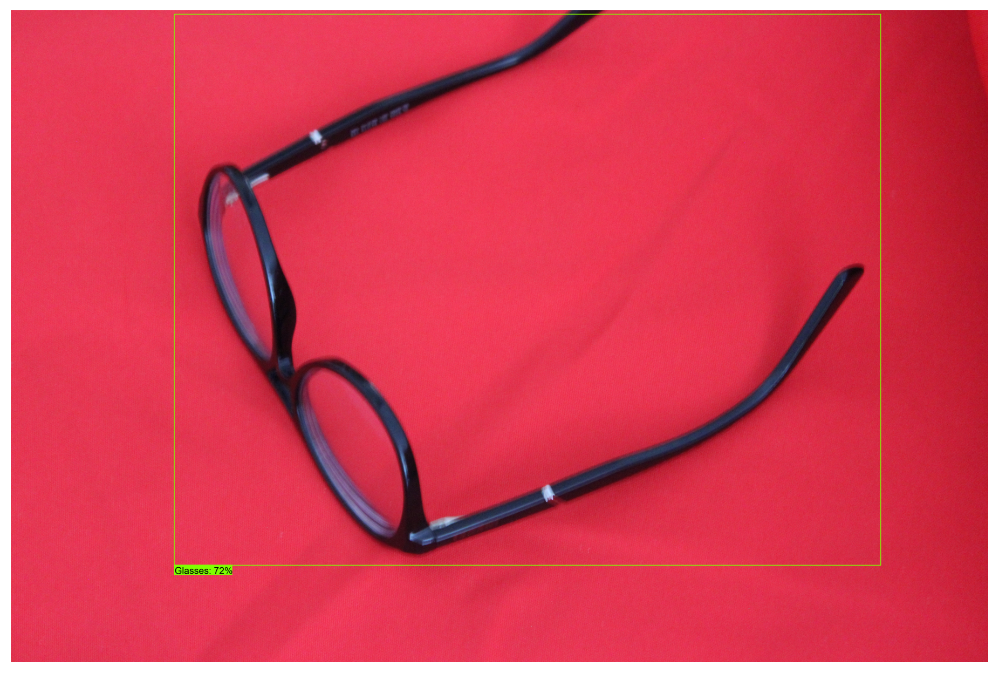

In [ ]:
image_path = "/content/drive/MyDrive/customTF6/all_images/val/EyeGlasses/EyeGlasses880.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = saved_model_after_training(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=4,
      min_score_thresh=.25, # Adjust this value to set the minimum probability boxes to be classified as True
      agnostic_mode=False)
%matplotlib inline
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.show()

# Load a checkpoint

In [ ]:
import os
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util

In [ ]:
CONFIG_PATH = '/content/drive/MyDrive/customTF6/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
CHECKPOINT_PATH = '/content/drive/MyDrive/customTF6/model_training'

In [ ]:
latest = tf.train.latest_checkpoint(CHECKPOINT_PATH)

In [ ]:
print(latest)

/content/drive/MyDrive/customTF6/model_training/ckpt-51


In [ ]:
model = tf.saved_model.load('/content/drive/MyDrive/customTF6/data/inference_graph/saved_model')

In [ ]:
print(model)

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject object at 0x7fc4b76bac50>
